In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [2]:
import welly

Wells selected from c1 are Well 11,12,13,14,15

Well 13,14 and 15 for training

Well 12 and 12 for prediction

In [3]:
well1= welly.Well.from_las('./C1/Well3451S.las').df()
well2= welly.Well.from_las('./C1/Well3431A.las').df()
well3= welly.Well.from_las('./C1/Well34410R.las').df()
well4= welly.Well.from_las('./C1/Well3451A.las').df()
well5= welly.Well.from_las('./C1/Well34121.las').df()

C:\Users\khank\anaconda3\lib\site-packages\welly\well.py:194: FutureWarning: From v0.5 the default will be 'original', keeping whatever is used in the LAS file. If you want to force conversion to metres, change your code to use `index='m'`.
  warnings.warn(m, FutureWarning)
C:\Users\khank\anaconda3\lib\site-packages\welly\curve.py:216: UserWarning: Irregular sampling in depth is not supported. Interpolating to regular basis.
  warnings.warn(m)


In [4]:
well1=  well1.reset_index()
well2=  well2.reset_index()
well3=  well3.reset_index()
well4=  well4.reset_index()
well5=  well5.reset_index()

In [5]:
well5= well5[['NPHI', 'RHOB', 'GR', 'RMED', 'PEF', 'CALI', 'DTC','Depth']].dropna()

In [6]:
well_df= well1, well2, well3, well4, well5

<ipython-input-7-33c9ff661d2f>:27: MatplotlibDeprecationWarning: Passing the pad parameter of tight_layout() positionally is deprecated since Matplotlib 3.3; the parameter will become keyword-only two minor releases later.
  plt.tight_layout(1.1)


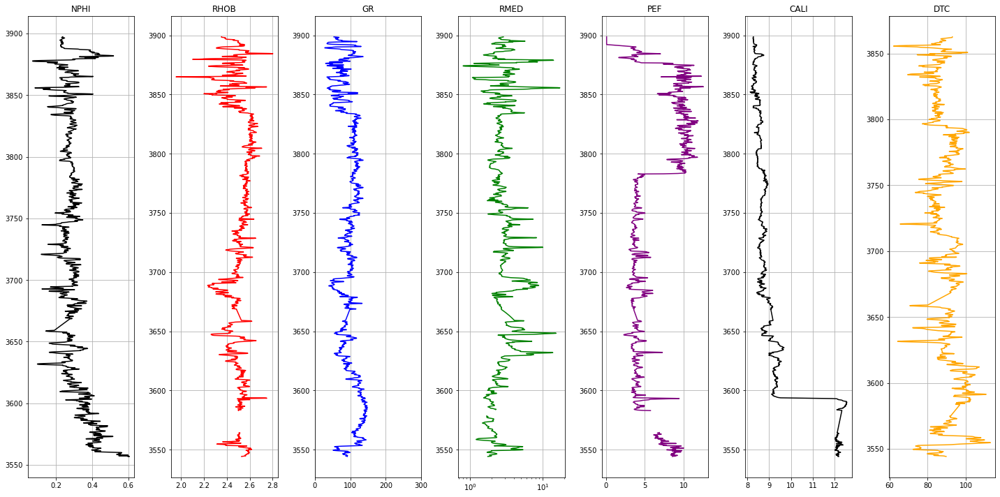

In [7]:
# Display train well data
well = well1
# train wells: well1, well3, well4

# define what logs are we going to us
logs = ['NPHI', 'RHOB', 'GR', 'RMED', 'PEF', 'CALI', 'DTC']

# create the subplots; ncols equals the number of logs
fig, ax = plt.subplots(nrows=1, ncols=len(logs), figsize=(20,10))

# looping each log to display in the subplots

colors = ['black', 'red', 'blue', 'green', 'purple', 'black', 'orange']

for i in range(len(logs)):
  if i == 3:
    # for resistivity, semilog plot
    ax[i].semilogx(well[logs[i]], well['Depth'], color=colors[i])
  else:
    # for non-resistivity, normal plot
    ax[i].plot(well[logs[i]], well['Depth'], color=colors[i])
  
  ax[i].set_title(logs[i])
  ax[i].grid(True)

ax[2].set_xlim(0, 300)
plt.tight_layout(1.1)
plt.show()

<ipython-input-8-09143206b81a>:26: MatplotlibDeprecationWarning: Passing the pad parameter of tight_layout() positionally is deprecated since Matplotlib 3.3; the parameter will become keyword-only two minor releases later.
  plt.tight_layout(1)


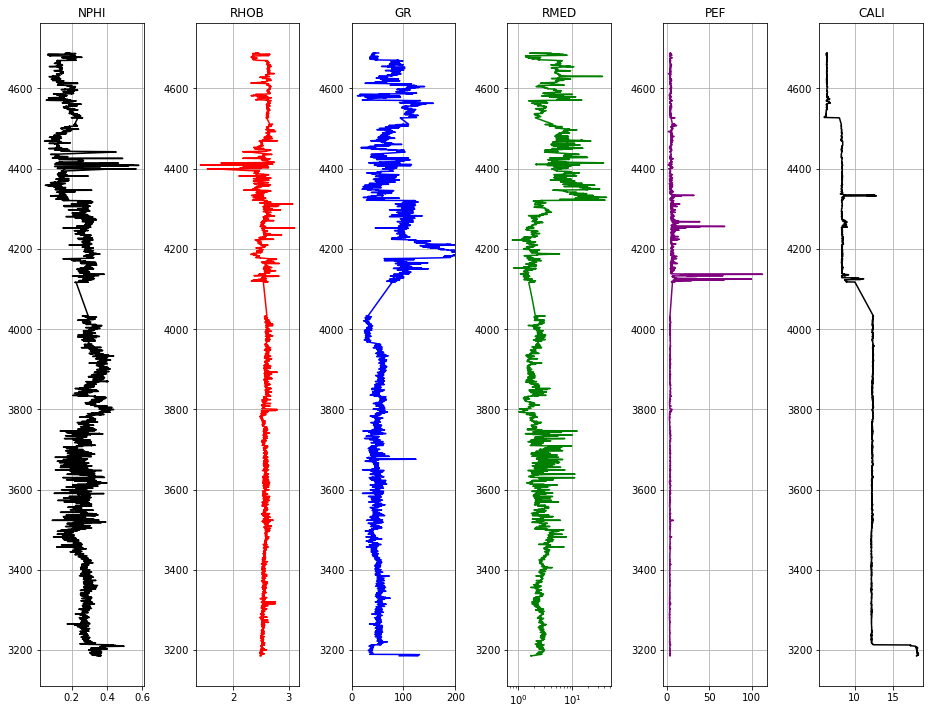

In [8]:
# Display the test data
well = well5 # test wells: well2, well5

# define what logs are we going to us
logs = ['NPHI', 'RHOB', 'GR', 'RMED', 'PEF', 'CALI']

# create the subplots; ncols equals the number of logs
fig, ax = plt.subplots(nrows=1, ncols=len(logs), figsize=(13,10))

# looping each log to display in the subplots

colors = ['black', 'red', 'blue', 'green', 'purple', 'black']

for i in range(len(logs)):
  if i == 3:
    # for resistivity, semilog plot
    ax[i].semilogx(well[logs[i]], well['Depth'], color=colors[i])
  else:
    # for non-resistivity, normal plot
    ax[i].plot(well[logs[i]], well['Depth'], color=colors[i])
  
  ax[i].set_title(logs[i])
  ax[i].grid(True)

ax[2].set_xlim(0, 200)
plt.tight_layout(1)
plt.show()

In [9]:
# lower limit
low = [3600, 3850, 3700, 2500, 3400]

# upper limit
up = [3850, 4100, 4200, 4000, 4400]

# train columns to use
train_cols = ['Depth', 'NPHI', 'RHOB', 'GR', 'RMED', 'PEF', 'CALI', 'DTC']

# test columns to use
test_cols = ['Depth', 'NPHI', 'RHOB', 'GR', 'RMED', 'PEF', 'CALI','DTC']

well_df_restrict = [0] * 5

for i in range(len(well_df)):
  # restrict depth within the given lower and upper limit
  df = well_df[i].loc[(well_df[i]['Depth'] >= low[i]) & (well_df[i]['Depth'] <= up[i])]

  if i == 0 or i == 2 or i == 3:
    # the train data, drop unwanted columns
    well_df_restrict[i] = df[train_cols]
  
  else:
    # the test data, drop unwanted columns
    well_df_restrict[i] = df[test_cols]

well1, well2, well3, well4, well5 = well_df_restrict

# as we can see, both ends already not have NaNs
well5

,Depth,NPHI,RHOB,GR,RMED,PEF,CALI,DTC
1534,3400.11758,0.29205,2.52990,56.53324,2.65271,3.31087,12.20608,91.71809
1535,3400.26958,0.28318,2.52792,57.02245,2.66100,3.28876,12.21780,91.47620
1536,3400.42158,0.27851,2.53380,54.35922,2.64858,3.26701,12.21450,91.10023
1537,3400.57358,0.27862,2.53361,51.28326,2.62053,3.26649,12.20013,90.09754
1538,3400.72558,0.27548,2.53196,49.26154,2.71003,3.31007,12.21673,89.47033
...,...,...,...,...,...,...,...,...
8108,4399.36558,0.43364,1.67617,70.54292,4.17334,3.07820,8.39565,113.99953
8109,4399.51758,0.56443,1.53549,59.62134,4.71428,2.48506,8.39884,118.61848
8110,4399.66958,0.40821,1.53262,64.27742,5.55568,2.18749,8.41006,119.90763
8111,4399.82158,0.22658,1.69511,75.07543,6.43878,2.35838,8.41120,120.40891


In [10]:
# check if NaNs exist, for each well
well5.isnull().sum()

Depth    0
NPHI     0
RHOB     0
GR       0
RMED     0
PEF      0
CALI     0
DTC      0
dtype: int64

In [11]:
# merge dataframes
well_train = pd.concat([well1, well3, well4])
well_pred = pd.concat([well2, well5])

In [12]:
well_train.isnull().sum()

Depth    0
NPHI     0
RHOB     0
GR       0
RMED     0
PEF      0
CALI     0
DTC      0
dtype: int64

In [13]:
well_pred.isnull().sum()

Depth    0
NPHI     0
RHOB     0
GR       0
RMED     0
PEF      0
CALI     0
DTC      0
dtype: int64

In [14]:

# assign names
names = ['Well3451S', 'Well3431A', 'Well34410R', 'Well3451A', 'Well34121']

names_train = []
names_pred = []
for i in range(len(well_df_restrict)):
  if i == 0 or i == 2 or i == 3:
    # train data, assign names 
    _ = np.full(len(well_df_restrict[i]), names[i])
    names_train.append(_)
  else:
    # test data, assign names
    _ = np.full(len(well_df_restrict[i]), names[i])
    names_pred.append(_)

# concatenate inside list
import itertools

names_train = list(itertools.chain.from_iterable(names_train))
names_pred = list(itertools.chain.from_iterable(names_pred))

# include well names to the train and pred dataframe
well_train['WELL'] = names_train
well_pred['WELL'] = names_pred

# move the depth column to the right
depth_train, depth_pred = well_train.pop('Depth'), well_pred.pop('Depth')
well_train['Depth'], well_pred['Depth'] = depth_train, depth_pred

well_pred

,NPHI,RHOB,GR,RMED,PEF,CALI,DTC,WELL,Depth
518,0.33807,2.56440,126.22847,2.41663,8.38940,8.64543,89.12193,Well3431A,3850.13671
519,0.32709,2.57277,129.76259,2.43207,8.28229,8.68180,88.25226,Well3431A,3850.28871
520,0.33569,2.56744,129.90176,2.47943,8.11240,8.71680,85.66439,Well3431A,3850.44071
521,0.32559,2.56868,128.62128,2.45566,8.03887,8.71216,85.87318,Well3431A,3850.59271
522,0.32521,2.57625,127.33805,2.46255,8.06328,8.58960,87.65280,Well3431A,3850.74471
...,...,...,...,...,...,...,...,...,...
8108,0.43364,1.67617,70.54292,4.17334,3.07820,8.39565,113.99953,Well34121,4399.36558
8109,0.56443,1.53549,59.62134,4.71428,2.48506,8.39884,118.61848,Well34121,4399.51758
8110,0.40821,1.53262,64.27742,5.55568,2.18749,8.41006,119.90763,Well34121,4399.66958
8111,0.22658,1.69511,75.07543,6.43878,2.35838,8.41120,120.40891,Well34121,4399.82158


In [15]:
well_pred['WELL'].unique()

array(['Well3431A', 'Well34121'], dtype=object)

In [16]:
print(well_train.shape)
print(well_pred.shape)

(14803, 9)
(8214, 9)


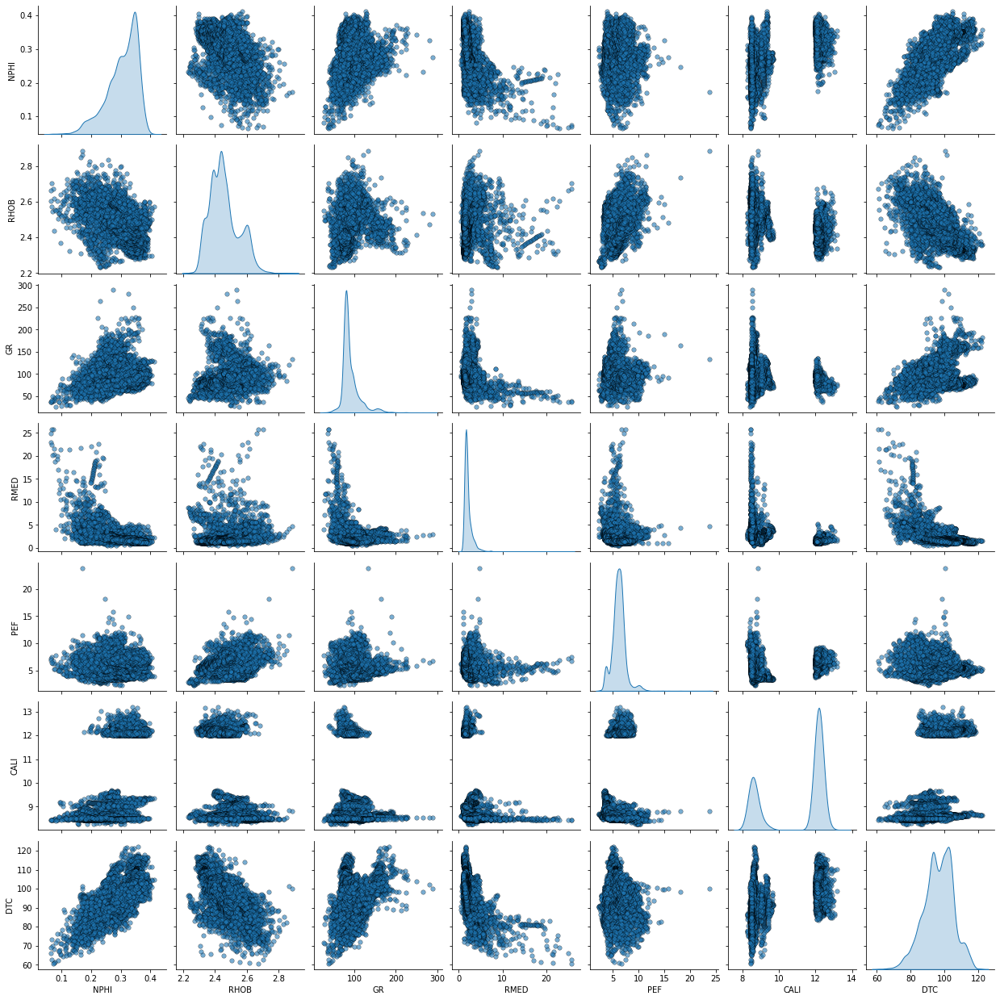

In [17]:
train_features = ['NPHI', 'RHOB', 'GR', 'RMED', 'PEF', 'CALI', 'DTC']

sns.pairplot(well_train, vars=train_features, diag_kind='kde',
             plot_kws = {'alpha': 0.6, 's': 30, 'edgecolor': 'k'})

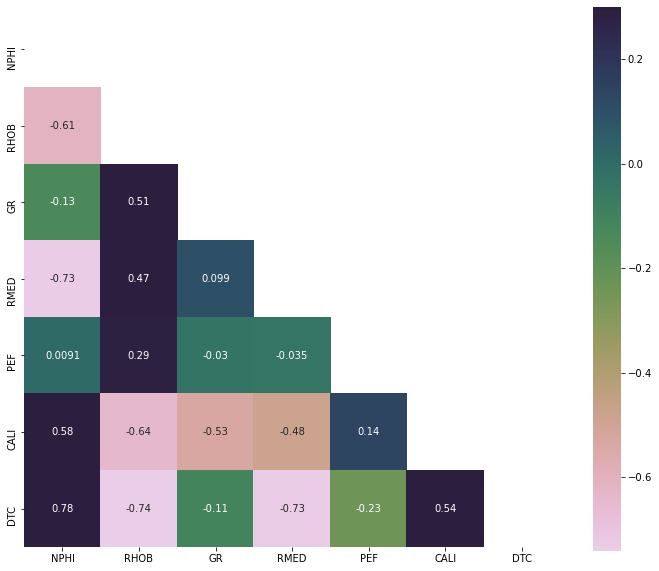

In [18]:
well_train_only_features = well_train[train_features]

# Generate a mask for the upper triangle
mask = np.zeros_like(well_train_only_features.corr(method = 'spearman') , dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Generate a custom diverging colormap
cmap = sns.cubehelix_palette(n_colors=12, start=-2.25, rot=-1.3, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
plt.figure(figsize=(12,10))
sns.heatmap(well_train_only_features.corr(method = 'spearman') ,annot=True,  mask=mask, cmap=cmap, vmax=.3, square=True)

plt.show()

Normalize the dataset:

Log transform the RT log

Use power transform with Yeo-Johnson method

Please note: we only transform the data except 'WELL' and 'DEPTH' column. We do this using Scikit-Learn's ColumnTransformer

In [19]:
colnames = well_train.columns
only_feature = ['NPHI', 'RHOB', 'GR', 'RMED', 'PEF', 'CALI'] # only feature column names
only_target = 'DTC' # only target column names
feature_target = np.append(only_feature, only_target) # feature and target column names

colnames

Index(['NPHI', 'RHOB', 'GR', 'RMED', 'PEF', 'CALI', 'DTC', 'WELL', 'Depth'], dtype='object')

In [20]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PowerTransformer

# transform the RT to logarithmic
well_train['RMED'] = np.log10(well_train['RMED'])

# normalize using power transform Yeo-Johnson method
scaler = PowerTransformer(method='yeo-johnson')

## ColumnTransformer
column_drop = ['WELL', 'Depth']
ct = ColumnTransformer([('transform', scaler, feature_target)], remainder='passthrough')

## fit and transform
well_train_norm = ct.fit_transform(well_train)

## convert to dataframe
well_train_norm = pd.DataFrame(well_train_norm, columns=colnames)
well_train_norm

,NPHI,RHOB,GR,RMED,PEF,CALI,DTC,WELL,Depth
0,2.019457,0.951372,1.810613,-0.039953,-2.49795,-1.272469,0.355221,Well3451S,3600.034
1,1.720796,0.910644,1.814365,-0.167744,-2.559666,-1.275512,0.33404,Well3451S,3600.186
2,1.337885,0.801458,1.794922,-0.180124,-2.4796,-1.278384,0.324332,Well3451S,3600.338
3,1.561105,0.736983,1.790891,-0.134593,-2.339496,-1.278432,0.33623,Well3451S,3600.49
4,1.802461,0.77768,1.767324,-0.101027,-2.195251,-1.280308,0.401243,Well3451S,3600.642
...,...,...,...,...,...,...,...,...,...
14798,0.843353,0.5732,0.160068,-0.923256,0.905415,0.62321,0.361972,Well3451A,3999.33799
14799,1.27529,0.471178,0.51833,-0.963323,0.852426,0.624373,0.142876,Well3451A,3999.48999
14800,1.276566,0.4058,0.58322,-0.99687,0.711094,0.585964,0.125843,Well3451A,3999.64199
14801,1.135076,0.355044,0.564967,-0.947671,0.811206,0.571628,0.407435,Well3451A,3999.79399


In [21]:
x = well_train_norm[feature_target].astype(float)
y = well_train_norm['WELL'].astype(str)
z = well_train_norm['Depth'].astype(float)

well_train_norm = pd.concat([x, y, z], axis=1)

In [22]:
well_train_norm.isnull().sum()

NPHI     0
RHOB     0
GR       0
RMED     0
PEF      0
CALI     0
DTC      0
WELL     0
Depth    0
dtype: int64

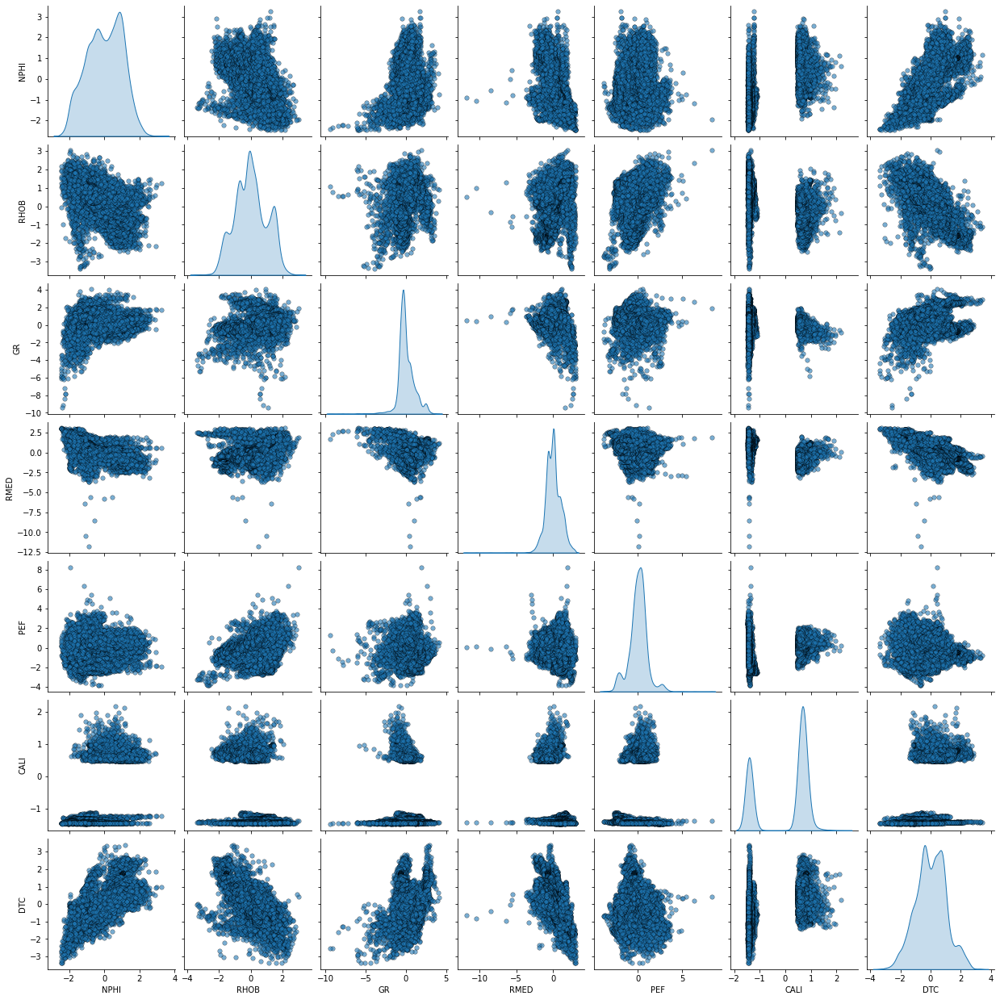

In [23]:
# x = well_train_norm[feature_target].astype(float)
sns.pairplot(well_train_norm, vars=feature_target, diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 30, 'edgecolor': 'k'})

### Removing Outliers

In [24]:
# make copy of well_train_norm, called well_train_dropped
well_train_drop = well_train_norm.copy()

# on the well_train_drop, drop WELL and DEPTH column
well_train_drop = well_train_norm.drop(['WELL', 'Depth'], axis=1)

In [25]:
from sklearn.ensemble import IsolationForest
from sklearn.covariance import EllipticEnvelope
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM

# Method 1: Standard Deviation Method (traditional)
well_train_std = well_train_drop[np.abs(well_train_drop - well_train_drop.mean()) <= (3 * well_train_drop.std())]

## delete all rows that have NaNs
well_train_std = well_train_std.dropna()

# Method 2: Isolation Forest
iso = IsolationForest(contamination=0.5)
yhat = iso.fit_predict(well_train_drop)
mask = yhat != -1
well_train_iso = well_train_norm[mask]

# Method 3: Minimum Covariance Determinant
ee = EllipticEnvelope(contamination=0.1)
yhat = ee.fit_predict(well_train_drop)
mask = yhat != -1
well_train_ee = well_train_norm[mask]

# Method 4: Local Outlier Factor
lof = LocalOutlierFactor(contamination=0.3)
yhat = lof.fit_predict(well_train_drop)
mask = yhat != -1
well_train_lof = well_train_norm[mask]

# Method 5: One-class SVM
svm = OneClassSVM(nu=0.1)
yhat = svm.fit_predict(well_train_drop)
mask = yhat != -1
well_train_svm = well_train_norm[mask]

Number of points before outliers removed                       : 14803
Number of points after outliers removed with Standard Deviation: 14473
Number of points after outliers removed with Isolation Forest  : 7402
Number of points after outliers removed with Min. Covariance   : 13322
Number of points after outliers removed with Outlier Factor    : 10362
Number of points after outliers removed with One-class SVM     : 13321


<ipython-input-26-22f1e3ac6e29>:34: MatplotlibDeprecationWarning: Passing the pad parameter of tight_layout() positionally is deprecated since Matplotlib 3.3; the parameter will become keyword-only two minor releases later.
  plt.tight_layout(1.7)


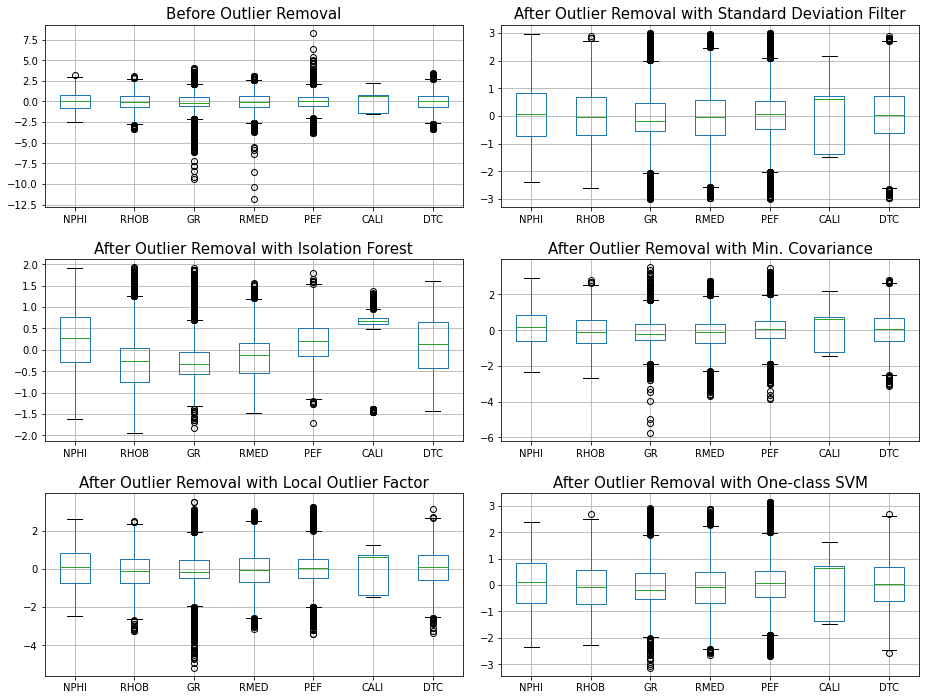

In [26]:
print('Number of points before outliers removed                       :', len(well_train_norm))
print('Number of points after outliers removed with Standard Deviation:', len(well_train_std))
print('Number of points after outliers removed with Isolation Forest  :', len(well_train_iso))
print('Number of points after outliers removed with Min. Covariance   :', len(well_train_ee))
print('Number of points after outliers removed with Outlier Factor    :', len(well_train_lof))
print('Number of points after outliers removed with One-class SVM     :', len(well_train_svm))

plt.figure(figsize=(13,10))

plt.subplot(3,2,1)
well_train_norm[feature_target].boxplot()
plt.title('Before Outlier Removal', size=15)

plt.subplot(3,2,2)
well_train_std[feature_target].boxplot()
plt.title('After Outlier Removal with Standard Deviation Filter', size=15)

plt.subplot(3,2,3)
well_train_iso[feature_target].boxplot()
plt.title('After Outlier Removal with Isolation Forest', size=15)

plt.subplot(3,2,4)
well_train_ee[feature_target].boxplot()
plt.title('After Outlier Removal with Min. Covariance', size=15)

plt.subplot(3,2,5)
well_train_lof[feature_target].boxplot()
plt.title('After Outlier Removal with Local Outlier Factor', size=15)

plt.subplot(3,2,6)
well_train_svm[feature_target].boxplot()
plt.title('After Outlier Removal with One-class SVM', size=15)

plt.tight_layout(1.7)
plt.show()

We choose the best method: One-class SVM. Make pair-plot of data after outliers removed.

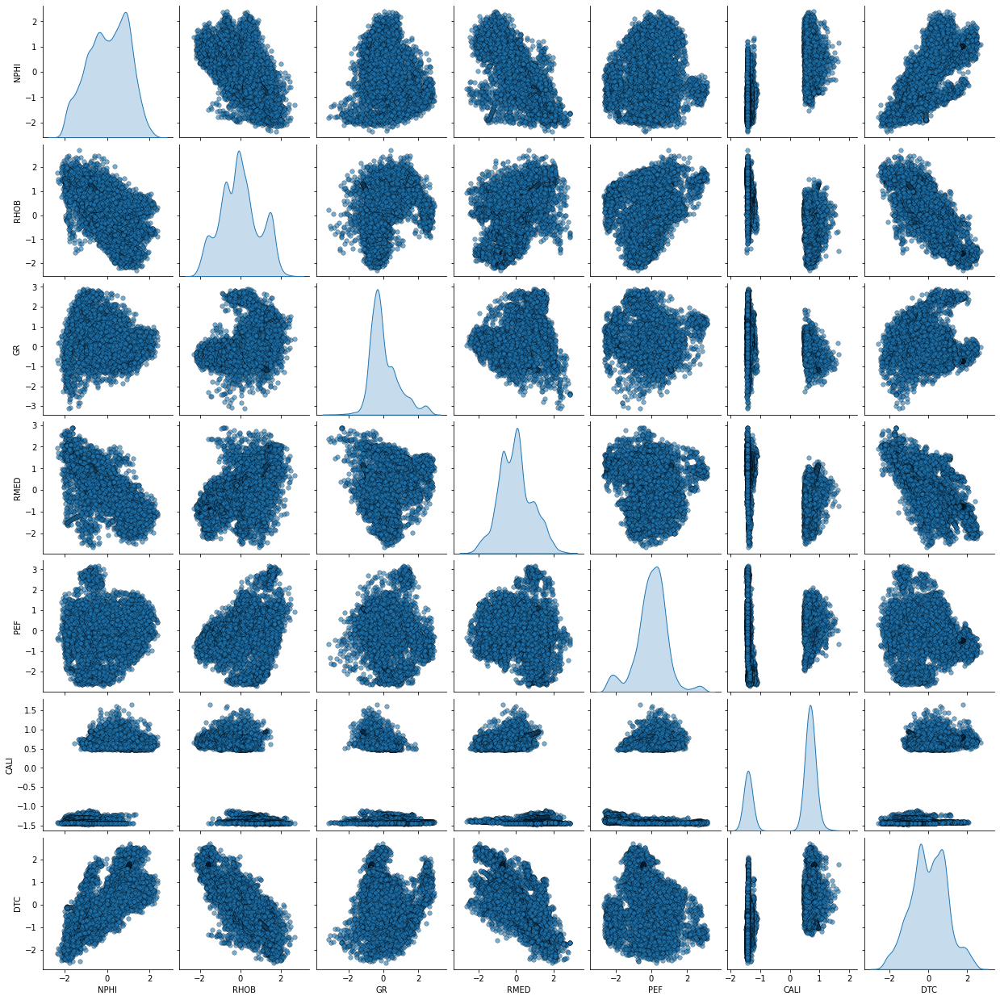

In [27]:
sns.pairplot(well_train_svm, vars=feature_target,
             diag_kind='kde',
             plot_kws = {'alpha': 0.6, 's': 30, 'edgecolor': 'k'})

### Prediction with PyCaret

In [31]:
well_train_svm= well_train_svm.drop(['WELL'],axis=1)
well_train_svm= well_train_svm.set_index('Depth')

In [32]:
well_train_svm.head()

,NPHI,RHOB,GR,RMED,PEF,CALI,DTC
Depth,,,,,,,
3601.858,0.301116,0.721893,1.662402,-0.035384,-2.395401,-1.254368,0.402593
3602.010,-0.005379,0.689956,1.683805,0.063650,-2.487415,-1.250209,0.349809
3602.162,0.055327,0.578144,1.593027,0.157149,-2.542533,-1.248568,0.332441
3602.314,0.041352,0.530762,1.526752,0.220690,-2.546493,-1.249773,0.265311
3602.466,-0.443581,0.583181,1.420673,0.282582,-2.506453,-1.253891,0.120087


In [28]:
from pycaret.regression import *

In [33]:
model= setup(data= well_train_svm, target= 'DTC',normalize= False,remove_outliers=False,trigonometry_features=True,profile=True)

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [34]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.1274,0.0330,0.1817,0.9621,0.1060,1.3604,0.4710
catboost,CatBoost Regressor,0.1417,0.0376,0.1938,0.9569,0.1139,1.3292,1.5960
rf,Random Forest Regressor,0.1378,0.0388,0.1969,0.9555,0.1138,1.4348,0.9350
lightgbm,Light Gradient Boosting Machine,0.1482,0.0413,0.2030,0.9527,0.1183,1.3819,0.2720
knn,K Neighbors Regressor,0.1434,0.0416,0.2039,0.9523,0.1171,1.2942,0.0140
xgboost,Extreme Gradient Boosting,0.1485,0.0421,0.2050,0.9518,0.1192,1.3906,0.6790
gbr,Gradient Boosting Regressor,0.1665,0.0508,0.2252,0.9417,0.1296,1.5906,0.4080
dt,Decision Tree Regressor,0.1879,0.0765,0.2764,0.9122,0.1528,1.9995,0.0260
ada,AdaBoost Regressor,0.2433,0.0924,0.3037,0.8942,0.1743,2.2576,0.1560
br,Bayesian Ridge,0.2378,0.0998,0.3156,0.8858,0.1738,1.8865,0.0190


ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=2330, verbose=0, warm_start=False)

Predictions with Extra Tree Regressor

In [35]:
et= create_model('et')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.1268,0.0330,0.1817,0.9650,0.1058,0.6596
1,0.1264,0.0319,0.1785,0.9646,0.1031,1.0686
2,0.1268,0.0329,0.1814,0.9622,0.1065,1.1910
3,0.1263,0.0342,0.1848,0.9611,0.1005,0.6394
4,0.1199,0.0289,0.1699,0.9669,0.0971,1.3073
5,0.1310,0.0348,0.1865,0.9602,0.1120,0.6426
6,0.1223,0.0299,0.1728,0.9649,0.1033,0.7686
7,0.1289,0.0355,0.1885,0.9601,0.1110,1.3234
8,0.1301,0.0343,0.1851,0.9599,0.1097,5.2555
9,0.1359,0.0352,0.1876,0.9565,0.1114,0.7480


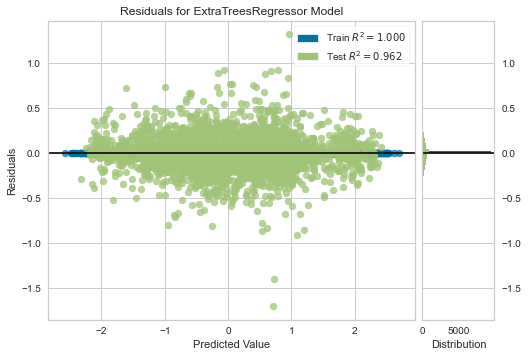

In [36]:
plot_model(et)

Making Test Data

In [37]:
well_pred.head()

,NPHI,RHOB,GR,RMED,PEF,CALI,DTC,WELL,Depth
518,0.33807,2.56440,126.22847,2.41663,8.38940,8.64543,89.12193,Well3431A,3850.13671
519,0.32709,2.57277,129.76259,2.43207,8.28229,8.68180,88.25226,Well3431A,3850.28871
520,0.33569,2.56744,129.90176,2.47943,8.11240,8.71680,85.66439,Well3431A,3850.44071
521,0.32559,2.56868,128.62128,2.45566,8.03887,8.71216,85.87318,Well3431A,3850.59271
522,0.32521,2.57625,127.33805,2.46255,8.06328,8.58960,87.65280,Well3431A,3850.74471


In [41]:
x = well_pred.drop(['WELL','DTC'],axis=1)
x= x.set_index('Depth')
X = scaler.fit_transform(x)
X= pd.DataFrame(X,columns= x.columns)

In [52]:
pred = predict_model(et,data= X)

In [45]:
y = well_train['DTC'].values
scaler.fit(y.reshape(-1,1))

PowerTransformer(copy=True, method='yeo-johnson', standardize=True)

In [54]:
pred['Label'] = scaler.inverse_transform(pred['Label'].values.reshape(-1,1))

In [65]:
pred

,NPHI,RHOB,GR,RMED,PEF,CALI,Label
0,1.163483,0.001266,1.448543,0.082269,1.349881,-1.105911,98.284571
1,0.949806,0.113172,1.492013,0.098079,1.331016,-1.089907,98.794327
2,1.116738,0.041654,1.493688,0.145436,1.299858,-1.074433,98.735823
3,0.921005,0.058212,1.478175,0.121879,1.285879,-1.076489,98.845893
4,0.913724,0.160355,1.462390,0.128750,1.290554,-1.130326,98.671413
...,...,...,...,...,...,...,...
8209,3.246797,-4.662642,0.369035,1.148013,-1.649466,-1.213727,97.633660
8210,6.819997,-4.795997,-0.009144,1.314142,-2.863086,-1.212373,97.018146
8211,2.651855,-4.798130,0.163989,1.504050,-3.711386,-1.207606,96.791287
8212,-0.782955,-4.639653,0.500882,1.645376,-3.199438,-1.207121,91.634712


In [66]:
well_pred= well_pred.reset_index()

In [67]:
well_pred

,index,NPHI,RHOB,GR,RMED,PEF,CALI,DTC,WELL,Depth
0,518,0.33807,2.56440,126.22847,2.41663,8.38940,8.64543,89.12193,Well3431A,3850.13671
1,519,0.32709,2.57277,129.76259,2.43207,8.28229,8.68180,88.25226,Well3431A,3850.28871
2,520,0.33569,2.56744,129.90176,2.47943,8.11240,8.71680,85.66439,Well3431A,3850.44071
3,521,0.32559,2.56868,128.62128,2.45566,8.03887,8.71216,85.87318,Well3431A,3850.59271
4,522,0.32521,2.57625,127.33805,2.46255,8.06328,8.58960,87.65280,Well3431A,3850.74471
...,...,...,...,...,...,...,...,...,...,...
8209,8108,0.43364,1.67617,70.54292,4.17334,3.07820,8.39565,113.99953,Well34121,4399.36558
8210,8109,0.56443,1.53549,59.62134,4.71428,2.48506,8.39884,118.61848,Well34121,4399.51758
8211,8110,0.40821,1.53262,64.27742,5.55568,2.18749,8.41006,119.90763,Well34121,4399.66958
8212,8111,0.22658,1.69511,75.07543,6.43878,2.35838,8.41120,120.40891,Well34121,4399.82158


In [68]:
well_train

,NPHI,RHOB,GR,RMED,PEF,CALI,DTC,WELL,Depth
367,0.38241,2.53724,130.89105,0.260346,3.40106,9.19747,99.62965,Well3451S,3600.03400
368,0.37414,2.53278,131.02191,0.243420,3.34670,9.18681,99.45415,Well3451S,3600.18600
369,0.36277,2.52108,130.34612,0.241820,3.41732,9.17669,99.37361,Well3451S,3600.33800
370,0.36951,2.51434,130.20677,0.247738,3.54296,9.17652,99.47231,Well3451S,3600.49000
371,0.37645,2.51858,129.39716,0.252161,3.67509,9.16988,100.00985,Well3451S,3600.64200
...,...,...,...,...,...,...,...,...,...
12366,0.34656,2.49775,89.35677,0.156810,7.27609,12.12626,99.68552,Well3451A,3999.33799
12367,0.36082,2.48778,96.25870,0.152759,7.20109,12.12725,97.85529,Well3451A,3999.48999
12368,0.36086,2.48153,97.60722,0.149404,7.00354,12.09432,97.71149,Well3451A,3999.64199
12369,0.35635,2.47675,97.22462,0.154336,7.14310,12.08191,100.06089,Well3451A,3999.79399


In [70]:
well_train1= well_train.drop(['WELL','Depth'],axis=1)

In [72]:
model= setup(data= well_train1, target= 'DTC',normalize=True,remove_outliers=True,trigonometry_features=True,profile=True)

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [73]:
et= create_model('et')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,1.0513,2.3064,1.5187,0.9604,0.0158,0.0110
1,1.2068,3.3111,1.8196,0.9449,0.0190,0.0126
2,1.1973,3.2040,1.7900,0.9514,0.0185,0.0125
3,1.1076,2.5723,1.6039,0.9586,0.0169,0.0116
4,1.1412,3.0590,1.7490,0.9535,0.0183,0.0120
5,1.1394,2.8451,1.6868,0.9573,0.0175,0.0118
6,1.1821,3.2009,1.7891,0.9527,0.0184,0.0123
7,1.1779,2.8339,1.6834,0.9539,0.0178,0.0124
8,1.2375,3.7357,1.9328,0.9460,0.0202,0.0129
9,1.0921,2.4055,1.5510,0.9625,0.0163,0.0115


In [77]:
#x = well_pred.drop(['WELL','DTC'],axis=1)
#x= x.drop(['index'],axis=1)
x= x.drop(['Depth'],axis=1)
x

,NPHI,RHOB,GR,RMED,PEF,CALI
0,0.33807,2.56440,126.22847,2.41663,8.38940,8.64543
1,0.32709,2.57277,129.76259,2.43207,8.28229,8.68180
2,0.33569,2.56744,129.90176,2.47943,8.11240,8.71680
3,0.32559,2.56868,128.62128,2.45566,8.03887,8.71216
4,0.32521,2.57625,127.33805,2.46255,8.06328,8.58960
...,...,...,...,...,...,...
8209,0.43364,1.67617,70.54292,4.17334,3.07820,8.39565
8210,0.56443,1.53549,59.62134,4.71428,2.48506,8.39884
8211,0.40821,1.53262,64.27742,5.55568,2.18749,8.41006
8212,0.22658,1.69511,75.07543,6.43878,2.35838,8.41120


In [78]:
pred1= predict_model(et,data= x)

In [79]:
pred1

,NPHI,RHOB,GR,RMED,PEF,CALI,Label
0,0.33807,2.56440,126.22847,2.41663,8.38940,8.64543,93.455416
1,0.32709,2.57277,129.76259,2.43207,8.28229,8.68180,92.423261
2,0.33569,2.56744,129.90176,2.47943,8.11240,8.71680,93.800142
3,0.32559,2.56868,128.62128,2.45566,8.03887,8.71216,91.856671
4,0.32521,2.57625,127.33805,2.46255,8.06328,8.58960,91.995289
...,...,...,...,...,...,...,...
8209,0.43364,1.67617,70.54292,4.17334,3.07820,8.39565,97.583711
8210,0.56443,1.53549,59.62134,4.71428,2.48506,8.39884,96.469169
8211,0.40821,1.53262,64.27742,5.55568,2.18749,8.41006,97.188350
8212,0.22658,1.69511,75.07543,6.43878,2.35838,8.41120,83.767692


In [82]:
well_pred_merge= well_pred[['DTC','Depth']]

In [83]:
merge= [pred1,well_pred_merge]
pred_df= pd.concat(merge,axis=1)

In [84]:
pred_df.head()

,NPHI,RHOB,GR,RMED,PEF,CALI,Label,DTC,Depth
0,0.33807,2.56440,126.22847,2.41663,8.38940,8.64543,93.455416,89.12193,3850.13671
1,0.32709,2.57277,129.76259,2.43207,8.28229,8.68180,92.423261,88.25226,3850.28871
2,0.33569,2.56744,129.90176,2.47943,8.11240,8.71680,93.800142,85.66439,3850.44071
3,0.32559,2.56868,128.62128,2.45566,8.03887,8.71216,91.856671,85.87318,3850.59271
4,0.32521,2.57625,127.33805,2.46255,8.06328,8.58960,91.995289,87.65280,3850.74471


In [85]:
pred_df.residual= pred_df['Label']-pred_df['DTC']

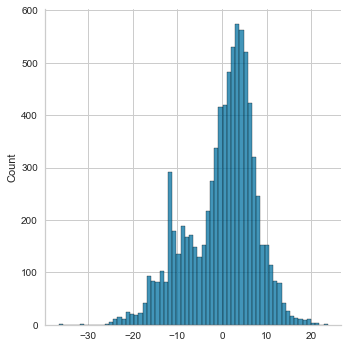

In [86]:
sns.displot(pred_df.residual)

The r2 for test data of selected 3 wells is : 0.25061217319739804


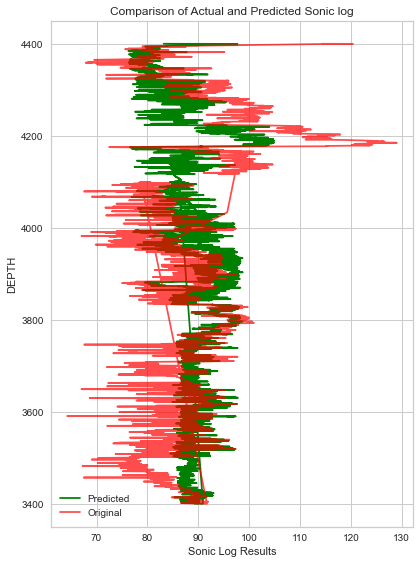

In [87]:
predicted= pred_df['Label']
orignal= pred_df['DTC']

from sklearn.metrics import r2_score

score= r2_score(orignal,predicted)
print("The r2 for test data of selected 3 wells is :",score)

new_df= pred_df.reset_index()
fig = plt.figure(figsize=(6,8))
ax1 = fig.add_subplot(111)
plt.title('Comparison of Actual and Predicted Sonic log')
ax1.plot(new_df["Label"], new_df["Depth"],  color = 'green', label='Predicted')
ax1.plot(new_df["DTC"], new_df["Depth"],  color = 'red', alpha = 0.7, label='Original')
ax1.legend()
plt.xlabel('Sonic Log Results')
plt.ylabel('DEPTH')
plt.tight_layout()
plt.show()

Predicitons with complete data set with Pycaret

In [88]:
import welly

In [91]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [108]:
well1= welly.Well.from_las('./C1/Well3352.las').df()
well2= welly.Well.from_las('./C1/Well3363S.las').df()
well3= welly.Well.from_las('./C1/Well3391.las').df()
well4= welly.Well.from_las('./C1/Well33917.las').df()
well5= welly.Well.from_las('./C1/Well341019.las').df()
well6= welly.Well.from_las('./C1/Well341021.las').df()
well7= welly.Well.from_las('./C1/Well341033.las').df()
well8= welly.Well.from_las('./C1/Well341035.las').df()
well9= welly.Well.from_las('./C1/Well34111.las').df()
well10= welly.Well.from_las('./C1/Well34112S.las').df()
well11= welly.Well.from_las('./C1/Well34121.las').df()
well12= welly.Well.from_las('./C1/Well3431A.las').df()
well13= welly.Well.from_las('./C1/Well34410R.las').df()
well14= welly.Well.from_las('./C1/Well3451A.las').df()
well15= welly.Well.from_las('./C1/Well3451S.las').df()
well16= welly.Well.from_las('./C1/Well34713.las').df()
well17= welly.Well.from_las('./C1/Well34720.las').df()
well18= welly.Well.from_las('./C1/Well34721.las').df()
well19= welly.Well.from_las('./C1/Well3481.las').df()
well20= welly.Well.from_las('./C1/Well3483.las').df()
well21= welly.Well.from_las('./C1/Well3487R.las').df()

In [109]:
well1=  well1.reset_index()
well2=  well2.reset_index()
well3=  well3.reset_index()
well4=  well4.reset_index()
well5=  well5.reset_index()
well6=  well5.reset_index()
well7=  well5.reset_index()
well8=  well5.reset_index()
well9=  well5.reset_index()
well10=  well5.reset_index()
well11=  well5.reset_index()
well12=  well5.reset_index()
well13=  well5.reset_index()
well14=  well5.reset_index()
well15=  well5.reset_index()
well16=  well5.reset_index()
well17=  well5.reset_index()
well18=  well5.reset_index()
well19=  well5.reset_index()
well20=  well5.reset_index()
well21=  well5.reset_index()

In [110]:
well1

,Depth,CALI,RSHA,RMED,RDEP,RHOB,GR,SGR,NPHI,PEF,...,ROP,DTS,DCAL,DRHO,MUDWEIGHT,RMIC,ROPA,RXO,FORCE_2020_LITHOFACIES_LITHOLOGY,FORCE_2020_LITHOFACIES_CONFIDENCE
0,3900.56007,9.24130,0.50664,2.45995,1.98489,NaN,101.95097,NaN,0.52836,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65000.0,NaN
1,3900.71207,9.14217,0.50295,2.75555,2.06780,NaN,97.08413,NaN,0.47399,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65000.0,NaN
2,3900.86407,9.04062,0.50800,2.77286,2.17996,NaN,103.77443,NaN,0.46563,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65000.0,1.0
3,3901.01607,8.96521,0.72010,3.03284,2.31947,NaN,114.38537,NaN,0.45833,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65000.0,1.0
4,3901.16807,8.94732,3.25830,3.51202,2.45292,NaN,123.55920,NaN,0.44730,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65000.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4086,4521.63207,6.15712,NaN,7.58551,5.98551,2.58987,81.63199,NaN,0.22900,NaN,...,NaN,NaN,NaN,-0.04281,NaN,NaN,NaN,NaN,65000.0,1.0
4087,4521.78407,6.15724,NaN,7.91046,5.89698,2.58128,81.20184,NaN,0.22839,NaN,...,NaN,NaN,NaN,-0.04161,NaN,NaN,NaN,NaN,65000.0,1.0
4088,4521.93607,6.15784,NaN,7.78160,5.76361,2.57363,78.78352,NaN,0.22002,NaN,...,NaN,NaN,NaN,-0.04145,NaN,NaN,NaN,NaN,65000.0,1.0
4089,4522.08807,6.16212,NaN,6.99713,5.64833,2.57764,76.62260,NaN,0.19992,NaN,...,NaN,NaN,NaN,-0.03760,NaN,NaN,NaN,NaN,65000.0,NaN


In [111]:
Wells_for_training= [well1,well4,well5,well6,well7,well9,well11,well12]
train_df= pd.concat(Wells_for_training)
Wells_for_testing= [well13,well14]
test_df= pd.concat(Wells_for_testing)

In [112]:
train_df= train_df.drop(['FORCE_2020_LITHOFACIES_CONFIDENCE','FORCE_2020_LITHOFACIES_LITHOLOGY','CALI','SGR','BS','SP','ROP','DCAL','MUDWEIGHT','RMIC','ROPA','DTS','RXO','RSHA','RMED'],axis=1)
test_df= test_df.drop(['FORCE_2020_LITHOFACIES_CONFIDENCE','FORCE_2020_LITHOFACIES_LITHOLOGY','CALI','SGR','BS','SP','ROP','DCAL','MUDWEIGHT','RMIC','ROPA','DTS','RXO','RSHA','RMED'],axis=1)

In [113]:
train_df

,Depth,RDEP,RHOB,GR,NPHI,PEF,DTC,DRHO,index
0,3900.56007,1.98489,NaN,101.95097,0.52836,NaN,92.98180,NaN,NaN
1,3900.71207,2.06780,NaN,97.08413,0.47399,NaN,96.97024,NaN,NaN
2,3900.86407,2.17996,NaN,103.77443,0.46563,NaN,100.41492,NaN,NaN
3,3901.01607,2.31947,NaN,114.38537,0.45833,NaN,101.14291,NaN,NaN
4,3901.16807,2.45292,NaN,123.55920,0.44730,NaN,102.25086,NaN,NaN
...,...,...,...,...,...,...,...,...,...
12639,2212.23200,0.58564,2.29906,45.01808,0.25331,NaN,NaN,-0.05443,12639.0
12640,2212.38400,0.58548,2.30965,42.30024,0.25115,NaN,NaN,-0.05231,12640.0
12641,2212.53600,0.60201,2.30630,37.81282,0.25393,NaN,NaN,-0.05578,12641.0
12642,2212.68800,0.64803,2.29905,32.50080,0.26203,NaN,NaN,-0.05747,12642.0


In [114]:
train_df= train_df.dropna()
test_df= test_df.dropna()

Normalising

In [106]:
colnames = train_df.columns
only_feature = ['NPHI', 'RHOB', 'GR', 'RMED', 'PEF', 'CALI'] # only feature column names
only_target = 'DTC' # only target column names
feature_target = np.append(only_feature, only_target) # feature and target column names

colnames

Index(['Depth', 'RDEP', 'RHOB', 'GR', 'NPHI', 'PEF', 'DTC', 'DRHO', 'index'], dtype='object')

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PowerTransformer

# transform the RT to logarithmic
well_train['RMED'] = np.log10(well_train['RMED'])

# normalize using power transform Yeo-Johnson method
scaler = PowerTransformer(method='yeo-johnson')

## ColumnTransformer
column_drop = ['WELL', 'Depth']
ct = ColumnTransformer([('transform', scaler, feature_target)], remainder='passthrough')

## fit and transform
well_train_norm = ct.fit_transform(well_train)

## convert to dataframe
well_train_norm = pd.DataFrame(well_train_norm, columns=colnames)
well_train_norm